#### Embedding Visualization Notebook
In the following notebook a visualization of the input embeddings, using UMAP, is created.

#### Set Environment

In [2]:
%load_ext autoreload
%autoreload 2

In [31]:
import pandas as pd
from umap import UMAP
import matplotlib.pyplot as plt
import seaborn as sns
import collections
from matplotlib.colors import ListedColormap

#### Load embedding data

In [32]:
embedding_data = pd.read_pickle('~/CODON_CVC/single_cell_data/GSE164522_colon_data/scCVC_GSE164522_all_labels_embeddings.pkl')
embedding_data.rename(columns={'Sequences':'cdr3_aa'}, inplace=True)

In [16]:
# put the cdr3_nt column as the last column
# cdr3_nt = embedding_data['cdr3_nt']
# embedding_data = embedding_data.drop(columns=['cdr3_nt'])
# embedding_data['cdr3_nt'] = cdr3_nt

Prepare MAIT Data

In [33]:
mait_label_data = pd.read_csv('/home/ubuntu/CODON_CVC/single_cell_data/GSE164522_colon_data/GSE164522_public_MAIT_extended.csv')

In [35]:
# add the MN_MT_MAIT_Unique column to the embedding data on the cdr3_aa column
embedding_data = embedding_data.merge(
    mait_label_data[['barcode', 'cdr3_aa', 'MN_MT_MAIT_unique']], 
    on=['barcode', 'cdr3_aa'], 
    how='left'
)
embedding_data['MN_MT_MAIT_unique'] = embedding_data['MN_MT_MAIT_unique'].fillna('Not_MAIT')

# change all the NaN values to 'Not_MAIT'
collections.Counter(embedding_data['MN_MT_MAIT_unique'])

Counter({'Not_MAIT': 160886,
         'Shared_MN_MT': 4030,
         'Unique_MN': 286,
         'Other_MAIT': 59,
         'Unique_MT': 33})

Subset MN Specific

In [36]:
# change the MN_MT_MAIT_unique label of Unique_MT to Other_MAIT 
embedding_data['MN_MT_MAIT_unique'] = embedding_data['MN_MT_MAIT_unique'].replace('Unique_MT', 'Other_MAIT')
embedding_data['MN_MT_MAIT_unique'] = embedding_data['MN_MT_MAIT_unique'].replace('Shared_MN_MT', 'MN_MAIT')
embedding_data['MN_MT_MAIT_unique'] = embedding_data['MN_MT_MAIT_unique'].replace('Unique_MN', 'MN_MAIT')
collections.Counter(embedding_data['MN_MT_MAIT_unique'])

Counter({'Not_MAIT': 160886, 'MN_MAIT': 4316, 'Other_MAIT': 92})

In [37]:
df_to_use = embedding_data

# extract embeddings and metadata
embeddings = df_to_use.iloc[:, 0:768].values
metadata = df_to_use.iloc[:, 768:]

#### Display Embeddings

In [ ]:
from visualization_utils import create_anndata, plot_embedding, plot_anndata_rep, generate_combined_palette

Ploting the UMAP using Adata

In [39]:
# Create an AnnData object
anndata = create_anndata(embeddings, metadata)

/home/ubuntu/miniconda3/envs/codon_cvc_env/lib/python3.10/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


#### Plot Chain Type

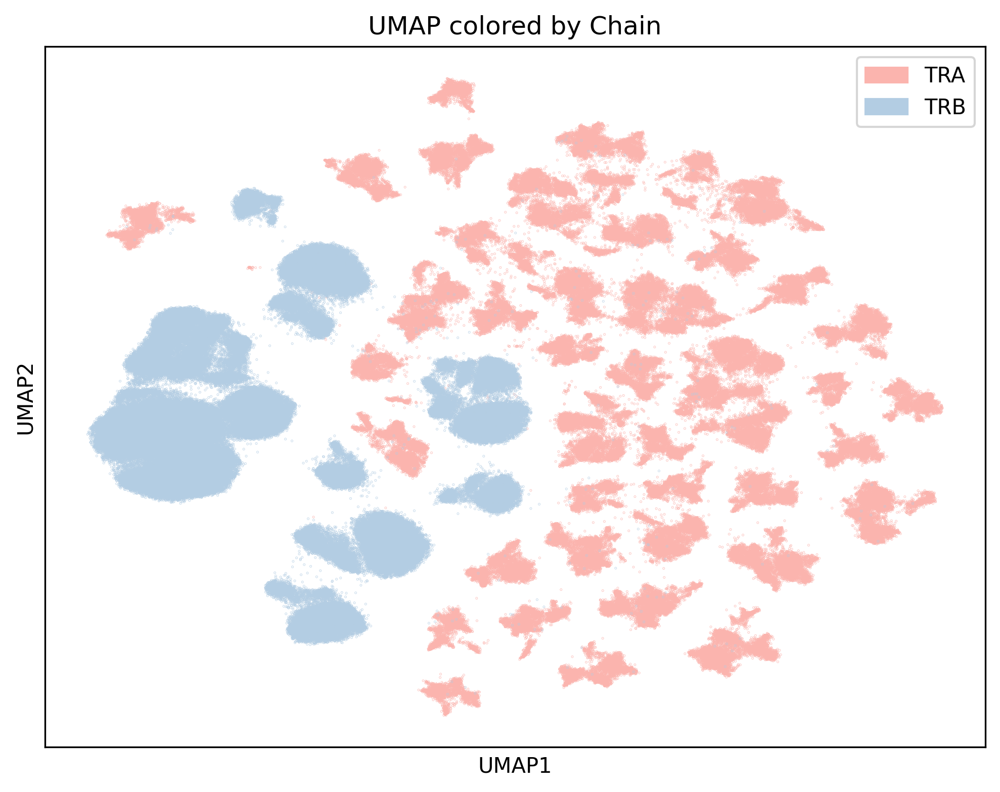

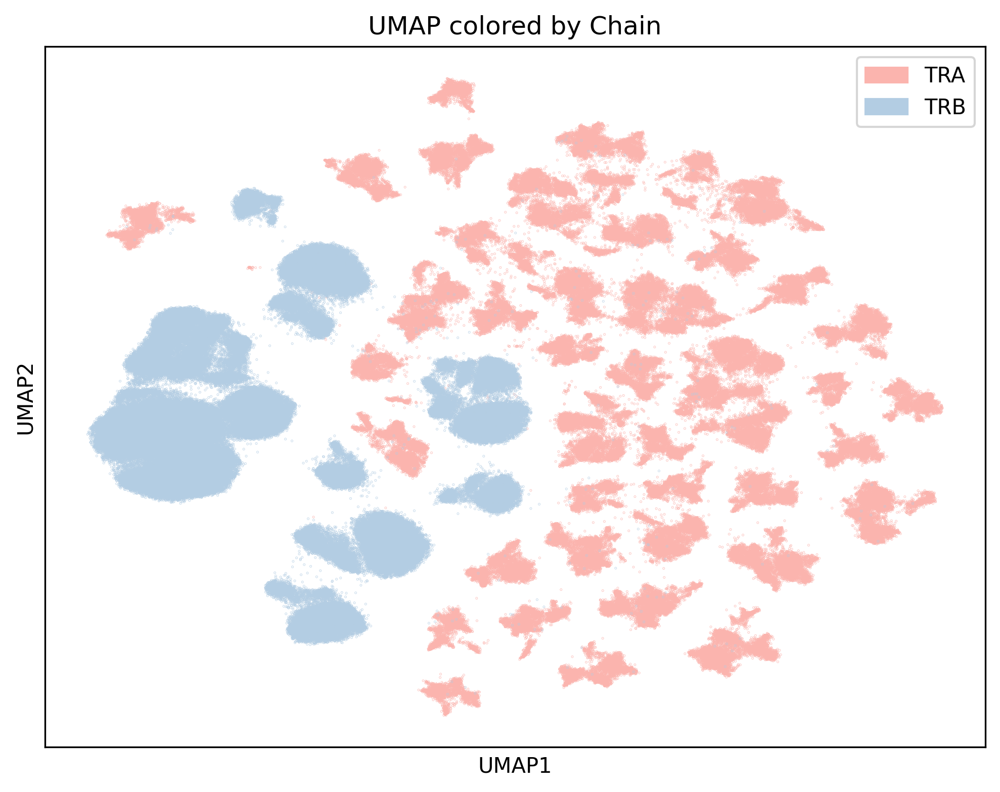

In [11]:
# Assuming you want to color by 'chain' and have a color map ready
plot_anndata_rep(a=anndata, color='chain', cmap=plt.get_cmap("Pastel1"), title="UMAP colored by Chain",
    direct_label=False, figsize=(8, 6), legend_size=10, fname="/home/ubuntu/CODON_CVC/plots/scDFnew_subsampled_400k_colored_by_chain.svg"
)

#### J Gene

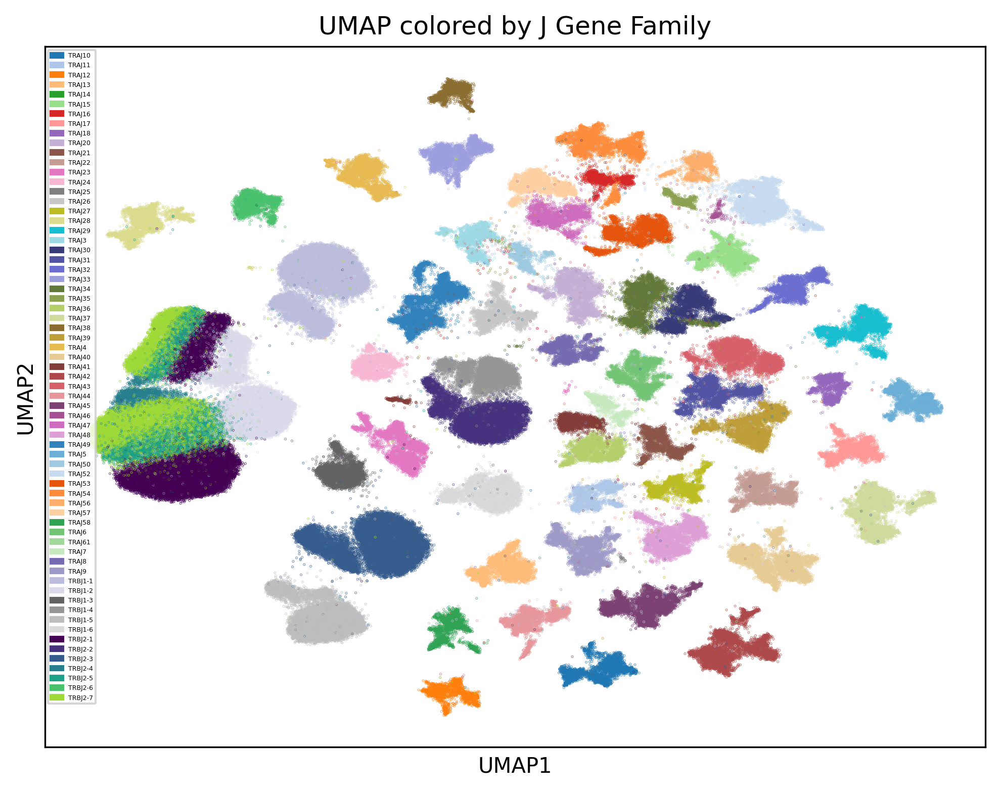

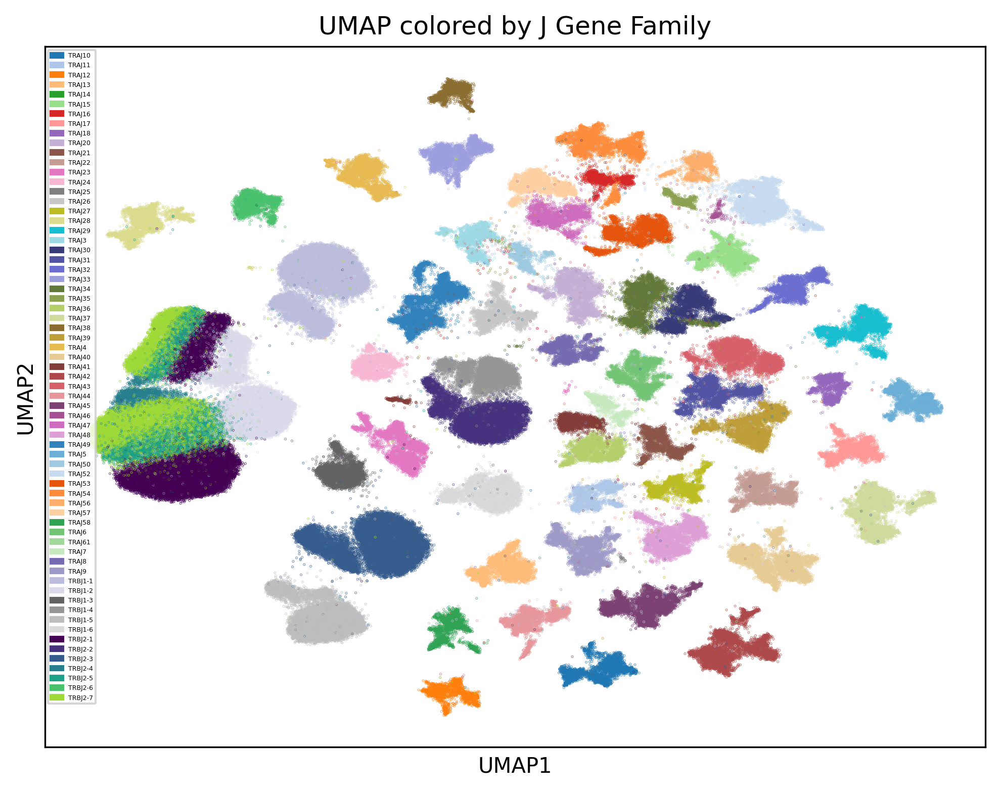

In [12]:
COLUMN_LABEL = 'j_gene_family'

# Generate palette with distinct colors
color_palette = generate_combined_palette(len(collections.Counter(metadata[COLUMN_LABEL])))

# Assuming you want to color by 'chain' and have a color map ready
plot_anndata_rep(a=anndata, color=COLUMN_LABEL, cmap=ListedColormap(color_palette), title="UMAP colored by J Gene Family",
    direct_label=False, figsize=(8, 6), legend_size=3,
    fname="/home/ubuntu/CODON_CVC/plots/scDFnew_subsampled_400k_colored_by_j_gene_family.svg"
)

#### V Gene

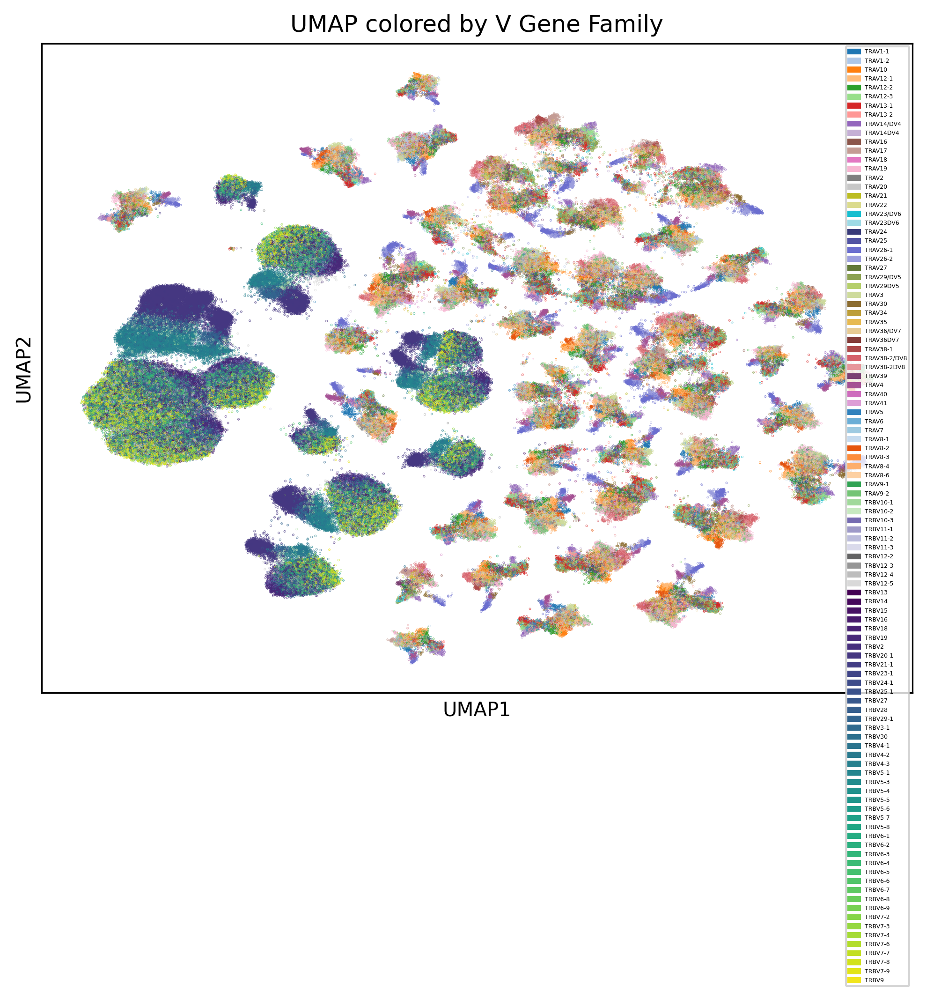

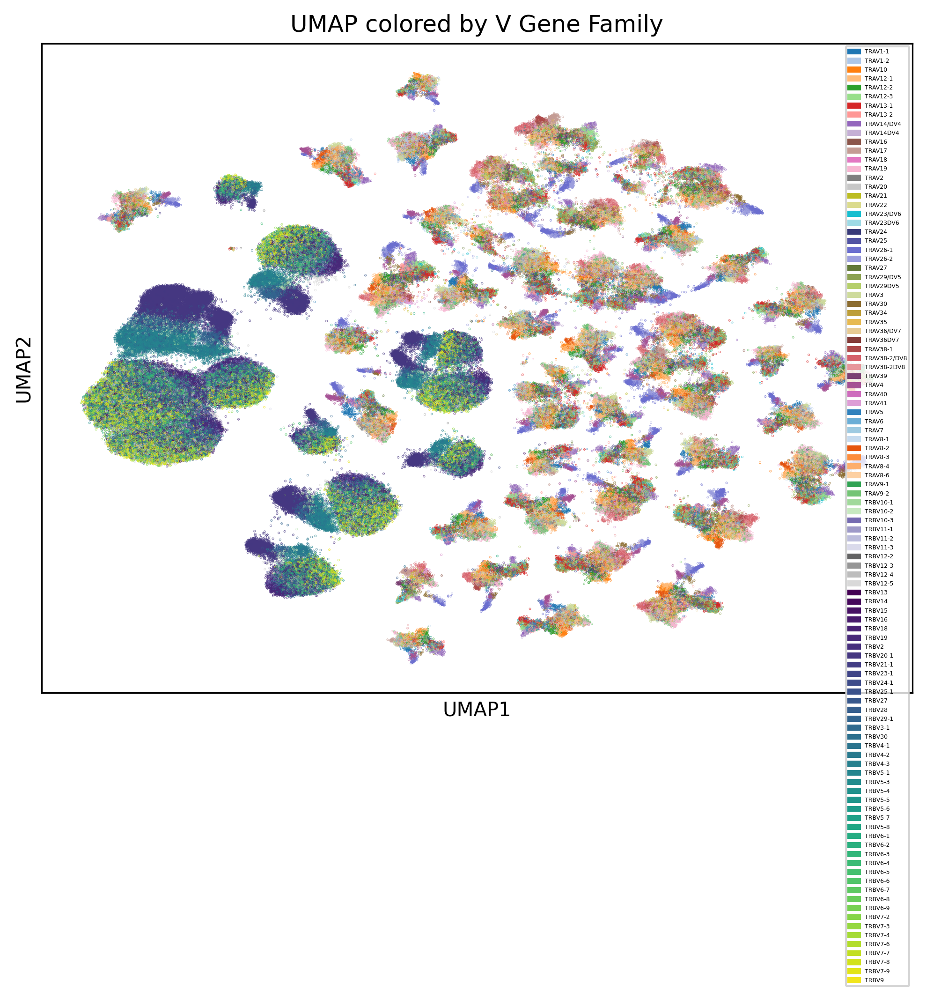

In [13]:
COLUMN_LABEL = 'v_gene_family'

# Generate palette with distinct colors
color_palette = generate_combined_palette(len(collections.Counter(metadata[COLUMN_LABEL])))

# Assuming you want to color by 'chain' and have a color map ready
plot_anndata_rep(a=anndata, color=COLUMN_LABEL,cmap=ListedColormap(color_palette),
    title="UMAP colored by V Gene Family", direct_label=False, figsize=(8, 6), legend_size=3,
    fname="/home/ubuntu/CODON_CVC/plots/scDFnew_subsampled_400k_colored_by_v_gene_family.svg"
)

#### MAIT

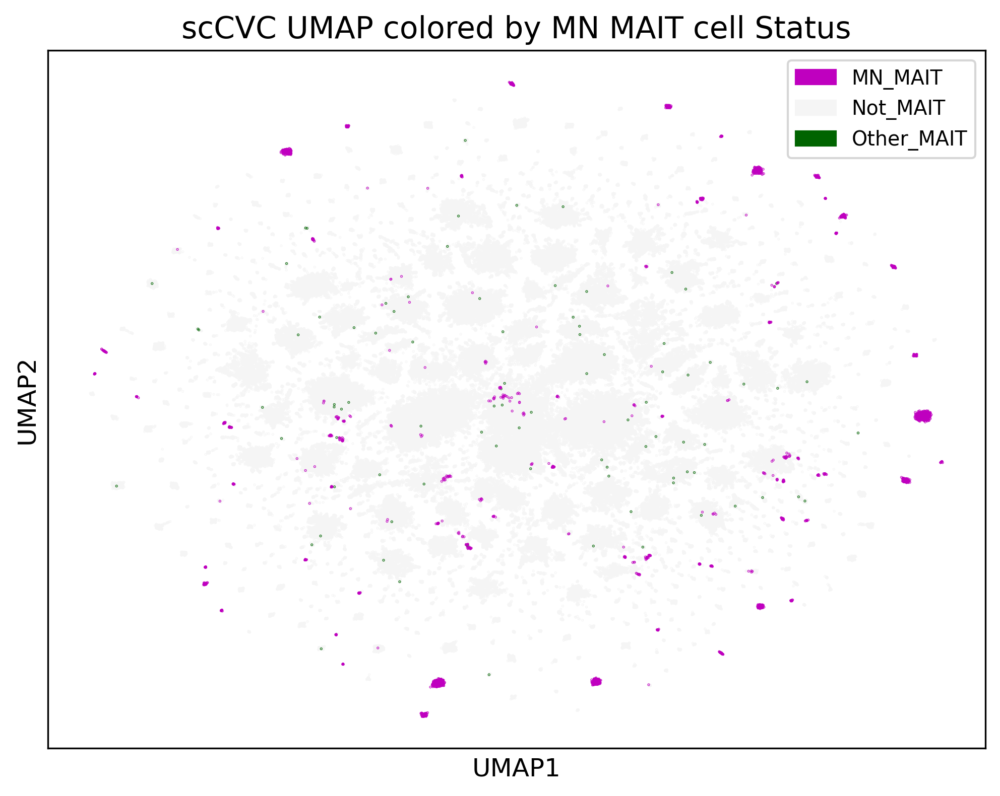

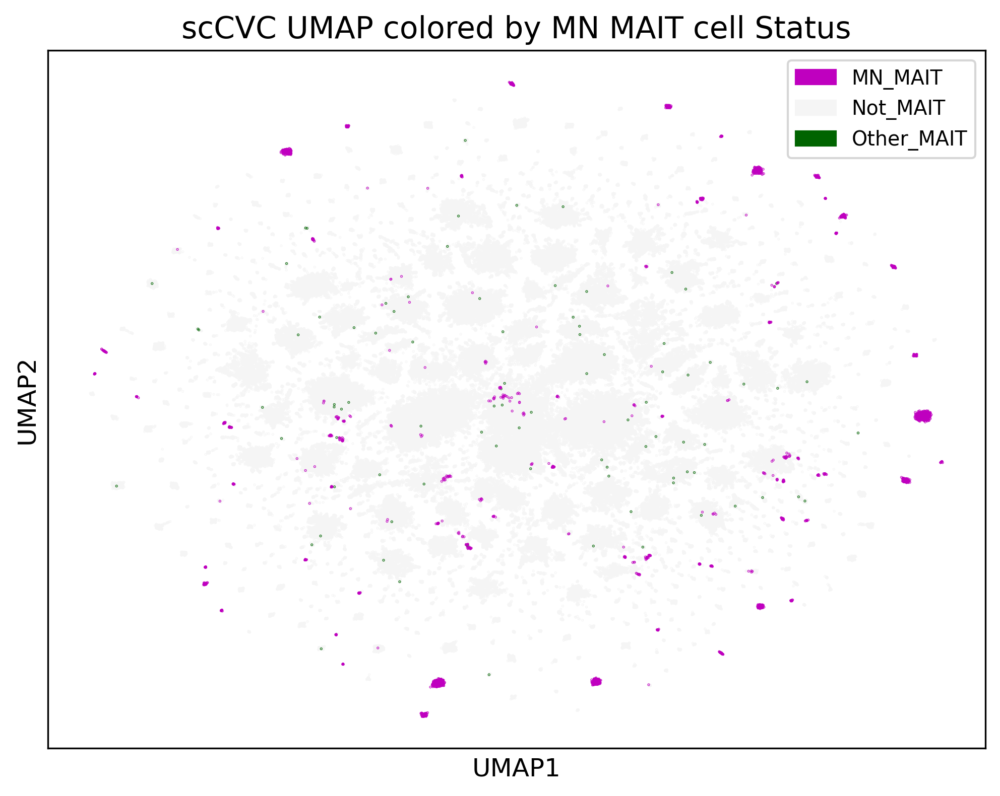

In [43]:
COLUMN_LABEL = 'MN_MT_MAIT_unique'

color_num = len(collections.Counter(embedding_data[COLUMN_LABEL]))
# color_map = ListedColormap(sns.color_palette("cubehelix", color_num))


# Define your color map
colors = [
    "#006d2c",  # Dark green for 'Shared_MN_MT'
    "#f0f0f0",  # Light gray for 'Not_MAIT'
    "#08519c",  # Dark blue for 'Unique_MN'
    "#a50f15",  # Dark red for 'Other_MAIT'
    "#54278f"   # Dark purple for 'Unique_MT'
]
colors = ['m', 'whitesmoke', 'darkgreen']

# Create a ListedColormap
color_map = ListedColormap(colors)

# Assuming you want to color by 'chain' and have a color map ready
plot_anndata_rep(a=anndata, color=COLUMN_LABEL, sort_column=COLUMN_LABEL,
    cmap=color_map, title="scCVC UMAP colored by MN MAIT cell Status", direct_label=False, figsize=(8, 6),legend_size=9.5,
    fname="/home/ubuntu/CODON_CVC/single_cell_data/GSE164522_colon_data/plots/scCVC_MN_Only_MAIT_embedding.png"
)